### Exploratory Data Analysis

For this model in a day we are going to be working with an Employee Turnover Dataset. We are going to be developing a Machine Learning model to predict whether or not an employee will leave the company and also get the explanation why someone may way to leave.

The dataset definition was provided for us and is as follows:

City: City where employee works (could be a protected class depending on socio economic factors etc) 

Employee Left: 1 = left, 0 = stayed

Hired through SMTP: A program that is used for recruitment, 1 = yes, 0 = no

Manager Rating of Likelihood to leave: The higher the rating the higher the likelihood

Marked for PHT Program: marked for an internal program, 1 = yes, 0 = no

Performance Evaluation: Score between 0-100

Social Media Activity – 1 point for each social media platform used of the 3, 3 means they use all 3 (twitter, facebook, Instagram), 0 means they use none

Survey, Relative, Attitude toward WorkType : 0-10, the higher the better the attitude 

Survey, Relative, Attitude toward Workload : 0-10, the higher the better the attitude

Survey, Relative, Peer's Average Attitude toward Manager:  0-10, the higher the better the attitude


We need to import in the libraries that we will be using for the data exploration.  %matplotlib inline is important to help the plots display without issues

In [2]:
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

%matplotlib inline

plt.style.use('bmh')

Let's look at the data

In [5]:
df = pd.read_csv('EmployeeTurnover.csv')
df.dropna(inplace=True)

In [6]:
#Let's look at the first few elements
df.head()

,City,EmailDomain,EmployeeLeft,HiredthroughSMTP,ManagerRatingOfLikelihoodToLeave,MarkedForPHTProgram,MostRecentPerformanceEvaluation,SocialMediaActivity,Survey_AttitudeTowardWorkType,Survey_AttitudeTowardWorkload,Survey_RelativePeerAverageAttitudeTowardManager
0,Sandaohezi,exblog.jp,0,0,1,1,59,0,2,2,1
1,Bandung,youtu.be,1,0,21,0,49,2,1,2,3
2,Kuala Terengganu,cbslocal.com,0,1,1,1,51,1,3,1,2
3,Beaverlodge,youtu.be,1,1,1,0,48,0,3,1,1
4,Ell,springer.com,1,0,1,1,57,0,2,2,2


In [7]:
# And the last few elements, there doesn't seem to be any sorting in the file
df.tail()

,City,EmailDomain,EmployeeLeft,HiredthroughSMTP,ManagerRatingOfLikelihoodToLeave,MarkedForPHTProgram,MostRecentPerformanceEvaluation,SocialMediaActivity,Survey_AttitudeTowardWorkType,Survey_AttitudeTowardWorkload,Survey_RelativePeerAverageAttitudeTowardManager
13995,Ell,youtu.be,0,0,1,0,57,1,2,7,1
13996,Beaverlodge,cbslocal.com,1,0,2,1,58,1,3,1,2
13997,Liancheng,cbslocal.com,0,1,1,0,48,3,1,2,1
13998,Liancheng,cbslocal.com,1,1,1,0,54,2,4,2,1
13999,Liancheng,springer.com,1,0,1,1,50,3,4,2,2


1    7977
0    6023
Name: EmployeeLeft, dtype: int64


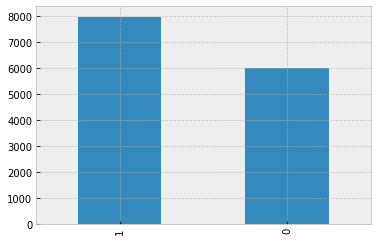

In [16]:
#Let's see how many employees actually left and visualize it
print(df['EmployeeLeft'].value_counts())
df['EmployeeLeft'].value_counts().plot(kind='bar')

,HiredthroughSMTP,ManagerRatingOfLikelihoodToLeave,MarkedForPHTProgram,MostRecentPerformanceEvaluation,SocialMediaActivity,Survey_AttitudeTowardWorkType,Survey_AttitudeTowardWorkload,Survey_RelativePeerAverageAttitudeTowardManager
EmployeeLeft,,,,,,,,
0,0.498755,1.085340,0.461564,52.010460,0.944546,1.657978,2.754607,2.198738
1,0.494171,2.228657,0.544190,52.690861,0.955121,2.830763,2.235427,1.706907


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14000 entries, 0 to 13999
Data columns (total 11 columns):
City                                               14000 non-null object
EmailDomain                                        14000 non-null object
EmployeeLeft                                       14000 non-null int64
HiredthroughSMTP                                   14000 non-null int64
ManagerRatingOfLikelihoodToLeave                   14000 non-null int64
MarkedForPHTProgram                                14000 non-null int64
MostRecentPerformanceEvaluation                    14000 non-null int64
SocialMediaActivity                                14000 non-null int64
Survey_AttitudeTowardWorkType                      14000 non-null int64
Survey_AttitudeTowardWorkload                      14000 non-null int64
Survey_RelativePeerAverageAttitudeTowardManager    14000 non-null int64
dtypes: int64(9), object(2)
memory usage: 1.2+ MB


In [4]:
df['City'].unique()

array(['Sandaohezi', 'Bandung', 'Kuala Terengganu', 'Beaverlodge', 'Ell',
       'Nuoxizhi', 'Liancheng'], dtype=object)

In [5]:
df.describe()

,EmployeeLeft,HiredthroughSMTP,ManagerRatingOfLikelihoodToLeave,MarkedForPHTProgram,MostRecentPerformanceEvaluation,SocialMediaActivity,Survey_AttitudeTowardWorkType,Survey_AttitudeTowardWorkload,Survey_RelativePeerAverageAttitudeTowardManager
count,14000.000000,14000.000000,14000.000000,14000.000000,14000.000000,14000.000000,14000.000000,14000.000000,14000.000000
mean,0.569786,0.496143,1.736786,0.508643,52.398143,0.950571,2.326214,2.458786,1.918500
std,0.495124,0.500003,3.339142,0.499943,4.429079,0.987738,1.529508,1.694173,0.954123
min,0.000000,0.000000,1.000000,0.000000,48.000000,0.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,1.000000,0.000000,49.000000,0.000000,1.000000,1.000000,1.000000
50%,1.000000,0.000000,1.000000,1.000000,51.000000,1.000000,2.000000,2.000000,2.000000
75%,1.000000,1.000000,1.000000,1.000000,54.000000,1.000000,3.000000,3.000000,2.000000
max,1.000000,1.000000,79.000000,1.000000,95.000000,7.000000,6.000000,7.000000,8.000000


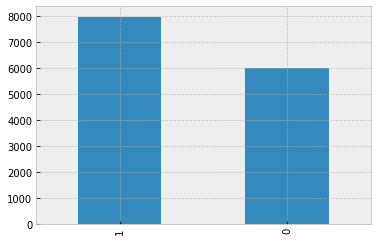

,HiredthroughSMTP,ManagerRatingOfLikelihoodToLeave,MarkedForPHTProgram,MostRecentPerformanceEvaluation,SocialMediaActivity,Survey_AttitudeTowardWorkType,Survey_AttitudeTowardWorkload,Survey_RelativePeerAverageAttitudeTowardManager
EmployeeLeft,,,,,,,,
0,0.498755,1.085340,0.461564,52.010460,0.944546,1.657978,2.754607,2.198738
1,0.494171,2.228657,0.544190,52.690861,0.955121,2.830763,2.235427,1.706907


In [8]:
df.describe(include=['O'])

,City,EmailDomain
count,14000,14000
unique,7,8
top,Nuoxizhi,youtu.be
freq,2995,5309


In [17]:
df_num = df.select_dtypes(include=['int64'])
df_num.head()

,EmployeeLeft,HiredthroughSMTP,ManagerRatingOfLikelihoodToLeave,MarkedForPHTProgram,MostRecentPerformanceEvaluation,SocialMediaActivity,Survey_AttitudeTowardWorkType,Survey_AttitudeTowardWorkload,Survey_RelativePeerAverageAttitudeTowardManager
0,0,0,1,1,59,0,2,2,1
1,1,0,21,0,49,2,1,2,3
2,0,1,1,1,51,1,3,1,2
3,1,1,1,0,48,0,3,1,1
4,1,0,1,1,57,0,2,2,2


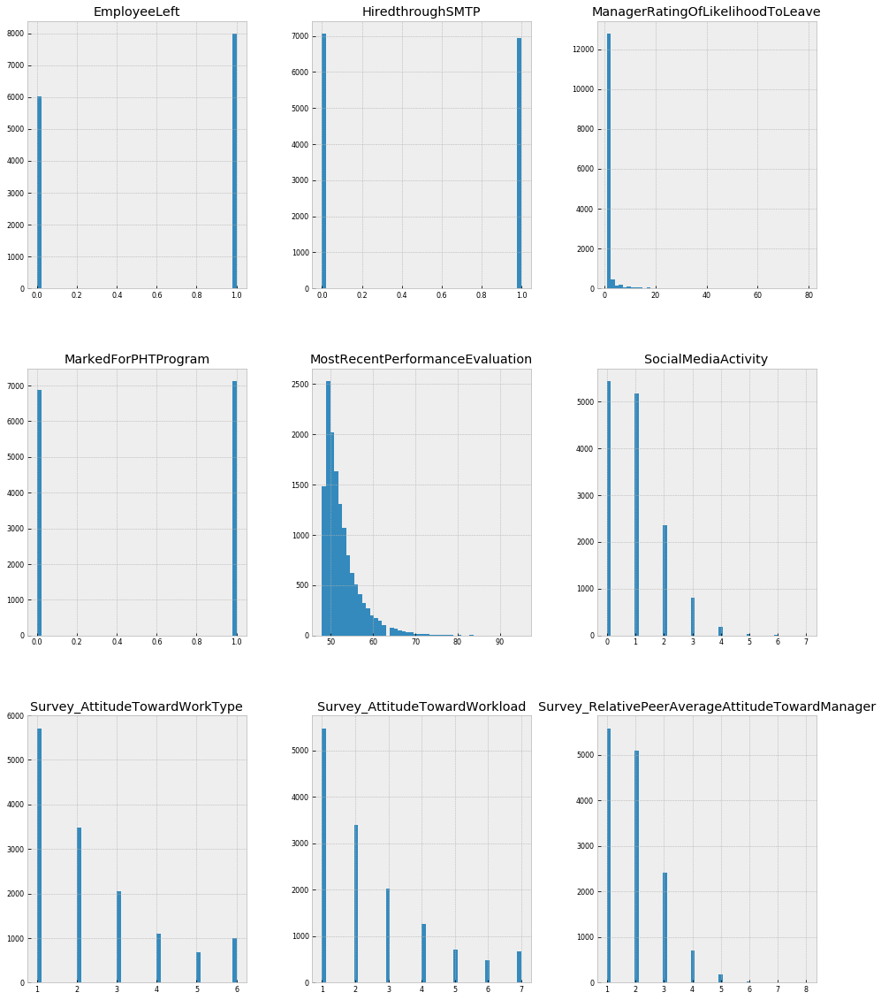

In [10]:
df_num.hist(figsize=(16,20),bins=50, xlabelsize=8, ylabelsize=8);

In [20]:
#We can look at what the mean score is for each numerical column based on whether the employee left or not.
df_num.groupby('EmployeeLeft').mean()

,HiredthroughSMTP,ManagerRatingOfLikelihoodToLeave,MarkedForPHTProgram,MostRecentPerformanceEvaluation,SocialMediaActivity,Survey_AttitudeTowardWorkType,Survey_AttitudeTowardWorkload,Survey_RelativePeerAverageAttitudeTowardManager
EmployeeLeft,,,,,,,,
0,0.498755,1.085340,0.461564,52.010460,0.944546,1.657978,2.754607,2.198738
1,0.494171,2.228657,0.544190,52.690861,0.955121,2.830763,2.235427,1.706907


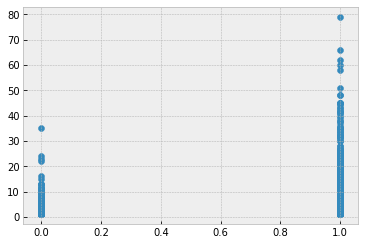

In [25]:
#Here is one way we can look at the distribution of data across a two variables to try to understand the relationship
plt.scatter(df['EmployeeLeft'], df['ManagerRatingOfLikelihoodToLeave'])


<function matplotlib.pyplot.show>

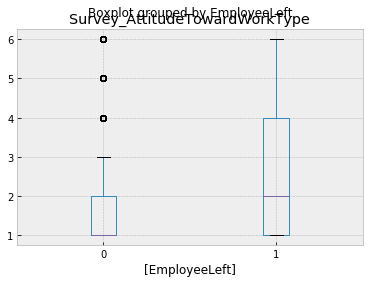

In [26]:
#Here is another way that will give us boxplots, try using the prior way and recognize the limitations
#plt.scatter(df['EmployeeLeft'], df['Survey_AttitudeTowardWorkType'])

df_num.boxplot(column=['Survey_AttitudeTowardWorkType'], by=['EmployeeLeft'])
plt.show


In [9]:
#Let's look at the correlation of EmployeeLeft and the rest of the columns
df_num_corr = df_num.corr()['EmployeeLeft'][1:]
golden_features_list = df_num_corr.sort_values(ascending=False)
print(golden_features_list)

Survey_AttitudeTowardWorkType                      0.379648
ManagerRatingOfLikelihoodToLeave                   0.169530
MarkedForPHTProgram                                0.081829
MostRecentPerformanceEvaluation                    0.076062
SocialMediaActivity                                0.005301
HiredthroughSMTP                                  -0.004539
Survey_AttitudeTowardWorkload                     -0.151731
Survey_RelativePeerAverageAttitudeTowardManager   -0.255226
Name: EmployeeLeft, dtype: float64


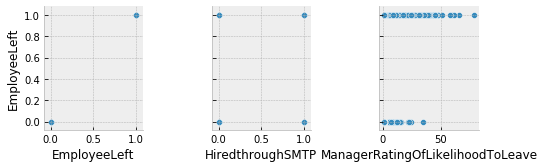

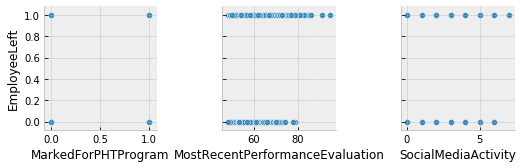

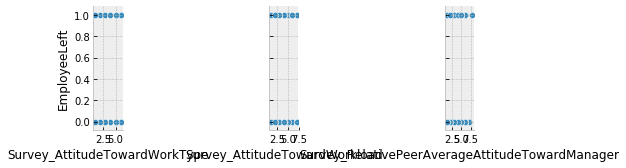

In [11]:
for i in range(0, len(df_num.columns), 3):
    sns.pairplot(data = df_num,
    x_vars = df_num.columns[i:i+3],
    y_vars=['EmployeeLeft'])



<function matplotlib.pyplot.show>

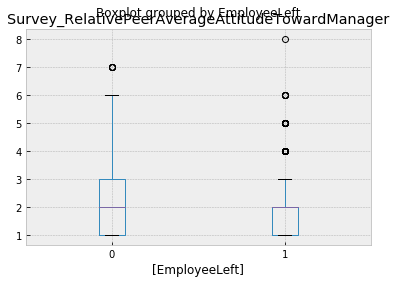

In [27]:
df_num.boxplot(column=['Survey_RelativePeerAverageAttitudeTowardManager'], by=['EmployeeLeft'])
plt.show


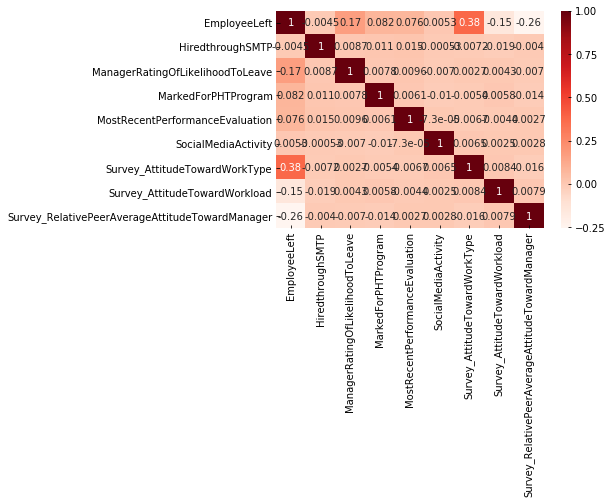

In [12]:
df.corr()
sns.heatmap(df.corr(), annot=True,cmap='Reds')
plt.show()

In [28]:
# Hypothesis testing, are EmployeeLeft and their Attitude toward work type dependent
stat, p = pearsonr(df['EmployeeLeft'],df['Survey_AttitudeTowardWorkType'])
print('stat=%.3f, p=%.3f' % (stat, p))

if p > 0.05:
	print('Probably independent')
else:
	print('Probably dependent')

stat=0.380, p=0.000
Probably dependent


In [29]:
# Hypothesis testing, are EmployeeLeft and Social Media Activity type dependent
from scipy.stats import kendalltau
stat, p = kendalltau(df['EmployeeLeft'],df['SocialMediaActivity'])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
	print('Probably independent')
else:
	print('Probably dependent')

stat=0.008, p=0.334
Probably independent


In [31]:
df_test = df_num[['EmployeeLeft', 'Survey_AttitudeTowardWorkload']]
df_grp = df_test.groupby(['Survey_AttitudeTowardWorkload'], as_index=False).mean()
df_grp

,Survey_AttitudeTowardWorkload,EmployeeLeft
0,1,0.642192
1,2,0.581834
2,3,0.538119
3,4,0.488133
4,5,0.448808
5,6,0.436709
6,7,0.387632


In [32]:
df_test = df_num[['EmployeeLeft', 'Survey_RelativePeerAverageAttitudeTowardManager']]
df_grp = df_test.groupby(['Survey_RelativePeerAverageAttitudeTowardManager'], as_index=False).mean()
df_grp


,Survey_RelativePeerAverageAttitudeTowardManager,EmployeeLeft
0,1,0.700143
1,2,0.551108
2,3,0.410818
3,4,0.310345
4,5,0.232558
5,6,0.238095
6,7,0.000000
7,8,1.000000


In [48]:
print((df_num[df.Survey_RelativePeerAverageAttitudeTowardManager == 8]).shape[0])

1


In [49]:
# Hypothesis testing, are EmployeeLeft and Social Media Activity type dependent
from scipy.stats import kendalltau
stat, p = kendalltau(df['EmployeeLeft'],df['Survey_RelativePeerAverageAttitudeTowardManager'])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
	print('Probably independent')
else:
	print('Probably dependent')

stat=-0.237, p=0.000
Probably dependent


In [ ]:
TODO
# Normalize features
# Recognize Outliers and what to do with them
# Chi Square
# multivariate analysis
# Add cat.codes